# Import libraries

In [1]:
import cv2 

import random
from random import sample
import argparse
import numpy as np
import os
import pickle
from tqdm import tqdm
from scipy.interpolate import NearestNDInterpolator

from collections import OrderedDict
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.covariance import LedoitWolf
from scipy.spatial.distance import mahalanobis
from scipy.ndimage import gaussian_filter
from skimage import morphology
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import matplotlib
import cv2 as cv
from PIL import Image

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

# Pre-trained model
from torchvision.models import wide_resnet50_2, resnet18 # torchvision library for pre-trained models

# Dataset
import datasets.data_process_original as mvtec # data_process.py is in the datasets folder
import datasets.fft_filter_normalized as fft_filter

C:\Users\kiran\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Function to plot the figures

In [469]:
def plot_fig(test_imgs, scores, fix_ratios, save_dir = "", save = False, title  = ""):
    """
    test_imgs: : real crack images 
    scores: test scores for test images 
    fix_ratio: fix_ratio for mask
    save_dir: location of directory for saving the images 
    """
    class_name = "test " #+ str(fix_ratio)
    num = len(test_imgs)
    vmax = scores.max() * 255.
    vmin = scores.min() * 255.
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(num):
        # Plotting
        fig_img, ax_img = plt.subplots(4, 4, figsize=(24,26))
        fig_img.tight_layout(pad = 0)
        fig_img.subplots_adjust(top=0.9) 
        fig_img.subplots_adjust(right=0.9) 
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        for row in ax_img:
            for ax_i in row:
                ax_i.axes.xaxis.set_visible(False)
                ax_i.axes.yaxis.set_visible(False)

    ##############################################################
         
        # padim only
        img = test_imgs[i]
        img = denormalization(img)
        for j,fix_ratio in enumerate(fix_ratios):
            heat_map = scores[i] * 255
            mask = scores[i].copy()
            mask_max = mask.max()
            mask_min = mask.min()
            # threshold
            threshold = mask_min + fix_ratio * (mask_max - mask_min)
            mask[mask > threshold] = 1
            mask[mask <= threshold] = 0
            kernel = morphology.disk(4)
            mask = morphology.opening(mask, kernel)
            mask *= 255
            vis_img = mark_boundaries(img, mask, color=(1, 0, 0), mode='thick')
            #############################################################
            # 1st, main image
            ax_img[j,0].imshow(img)
            ax_img[j,0].title.set_text('original image')

            # 2nd, PADIM Predicted heat map
            ax = ax_img[j,1].imshow(heat_map, cmap='jet', norm=norm)
            ax_img[j,1].imshow(img, cmap='gray', interpolation='none')
            ax_img[j,1].imshow(heat_map, cmap='jet', alpha=0.5, interpolation='none')
            ax_img[j,1].title.set_text(f'Predicted heat map with fix_ratio {fix_ratio}')

            # 3rd, PADIM Predicted mask
            ax_img[j, 2].imshow(mask, cmap='gray')
            ax_img[j, 2].title.set_text(f'Predicted mask with fix_ratio {fix_ratio}')

            # 4th, PADIM Segmentation result
            ax_img[j, 3].imshow(vis_img)
            ax_img[j, 3].title.set_text(f'Segmentation result with fix_ratio {fix_ratio}')

        left = 0.92
        bottom = 0.15
        width = 0.015
        height = 1 - 2 * bottom
        rect = [left, bottom, width, height]
        cbar_ax = fig_img.add_axes(rect)
        cb = plt.colorbar(ax, shrink=0.6, cax=cbar_ax, fraction=0.046)
        cb.ax.tick_params(labelsize=8)
        font = {
            'family': 'serif',
            'color': 'black',
            'weight': 'normal',
            'size': 8,
        }
        cb.set_label('Anomaly Score', fontdict=font)
        plt.suptitle(title)
        if save:
            os.makedirs(save_dir + '/compare_imgs/', exist_ok=True)
            fig_img.savefig(os.path.join(save_dir + '/compare_imgs/', class_name + str(i)), dpi=100)
            plt.close()
        else:
            plt.show()
            plt.close()
            break

# Settings

In [2]:
# device setup
use_cuda = torch.cuda.is_available()
device = torch.device('cuda' if use_cuda else 'cpu')

In [ ]:
# name = "transistor"
# # Directories
# save_path  = f'./resulting_imgs/data_science/{name}'
# # Creating directory to store the results
# os.makedirs(os.path.join(save_path, 'temp_'+ architecture), exist_ok=True)
# train_feature_filepath = os.path.join(save_path, 'temp_%s' % architecture, 'train_%s.pkl' % class_name)

In [383]:
transistor_path =  "transistor/good_misplaced/"
crack_path = "cracks/"

file_location = f'./resulting_imgs/data_science/'


In [377]:
def get_img_embed(path):
    file_location = f'./resulting_imgs/data_science/{path}'
    train_embedding_vectors = np.load(file_location + "/train_np.npy")
    
    if os.path.exists(file_location + "/test_np.npy"):
        test_embedding_vectors = np.load(file_location + "/test_np.npy")
    else:
        test_embedding_vectors = None
        
    if os.path.exists(file_location + "/test_imgs.npy"):
        test_imgs = np.load(file_location + "/test_imgs.npy")
    else:
        test_imgs = None
        
    bad = np.load(file_location + "/raw_images.npy")
    try:
        good = np.load(file_location + "/good_imgs.npy")
    except: 
        good = None
    return bad, good, train_embedding_vectors, test_embedding_vectors,test_imgs 

In [378]:
crack_img ,_ ,crack_embed, _,test_imgs = get_img_embed(crack_path)

In [379]:
bad, good, transistor_embed, tran_test_embed, test_imgs = get_img_embed(transistor_path)

In [373]:
transistor_img.shape

(10, 1024, 1024)

In [380]:
test_imgs.shape

(10, 3, 224, 224)

# Transistor

In [374]:
good.shape

(213, 1024, 1024)

In [375]:
bad.shape

(10, 1024, 1024)

In [376]:
tran_test_embed.shape

(10, 448, 56, 56)

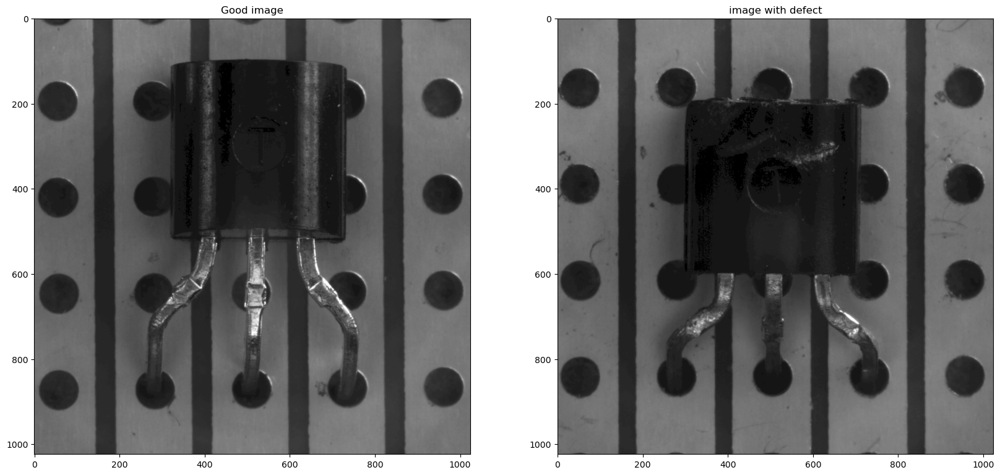

In [341]:
n = 5
bad_img = bad[n]
good_img = good[n]
fig_img, ax_img = plt.subplots(1, 2, figsize=(20, 15))
ax_img[0].imshow(good[n],  cmap = "gray")
ax_img[0].title.set_text('Good image')

ax_img[1].imshow( bad[n], cmap = "gray")
ax_img[1].title.set_text('image with defect')


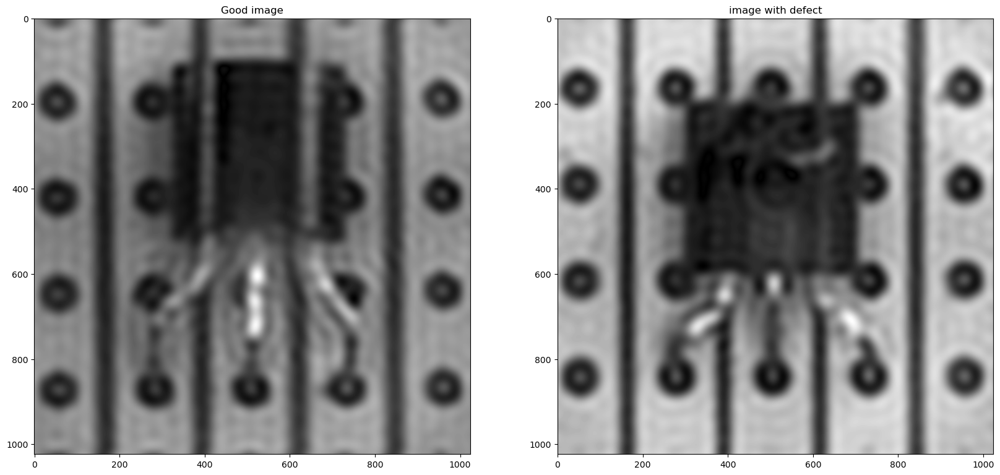

In [153]:
fig_img, ax_img = plt.subplots(1, 2, figsize=(20, 15))
ax_img[0].imshow(fft_filter.fft(torch.tensor(good_img))(25,0),  cmap = "gray")
ax_img[0].title.set_text('Good image')

ax_img[1].imshow( fft_filter.fft(torch.tensor(bad_img))(25,0), cmap = "gray")
ax_img[1].title.set_text('image with defect')

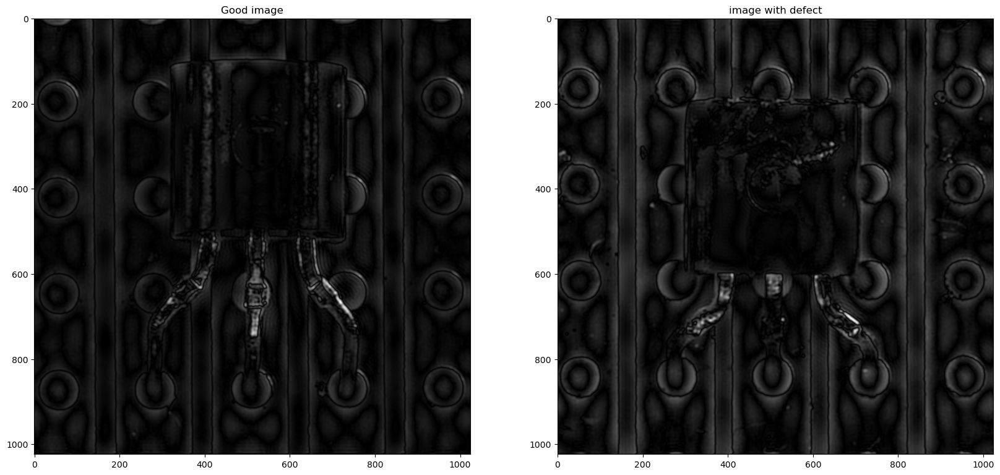

In [158]:
fig_img, ax_img = plt.subplots(1, 2, figsize=(20, 15))
ax_img[0].imshow(fft_filter.fft(torch.tensor(good_img))(120,10),  cmap = "gray")
ax_img[0].title.set_text('Good image')

ax_img[1].imshow( fft_filter.fft(torch.tensor(bad_img))(120,10), cmap = "gray")
ax_img[1].title.set_text('image with defect')

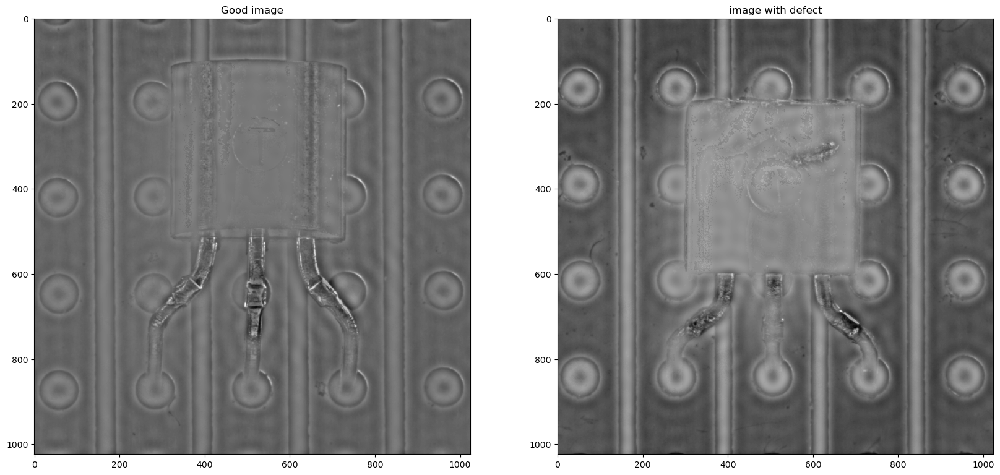

In [162]:
fig_img, ax_img = plt.subplots(1, 2, figsize=(20, 15))
ax_img[0].imshow(good_img- fft_filter.fft(torch.tensor(good_img))(25,0),  cmap = "gray")
ax_img[0].title.set_text('Good image')

ax_img[1].imshow( bad_img - fft_filter.fft(torch.tensor(bad_img))(25,0), cmap = "gray")
ax_img[1].title.set_text('image with defect')

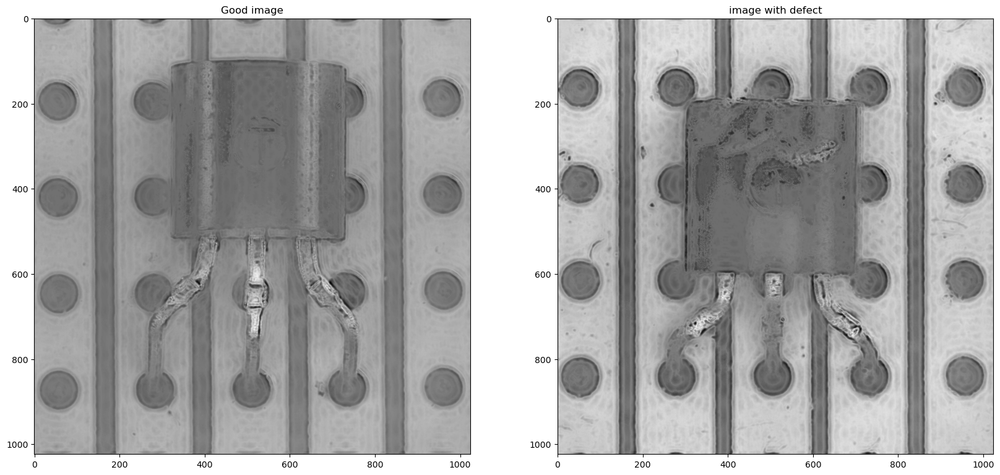

In [164]:
fig_img, ax_img = plt.subplots(1, 2, figsize=(20, 15))
ax_img[0].imshow(good_img- fft_filter.fft(torch.tensor(good_img))(120,30),  cmap = "gray")
ax_img[0].title.set_text('Good image')

ax_img[1].imshow( bad_img - fft_filter.fft(torch.tensor(bad_img))(120,30), cmap = "gray")
ax_img[1].title.set_text('image with defect')

# Crack

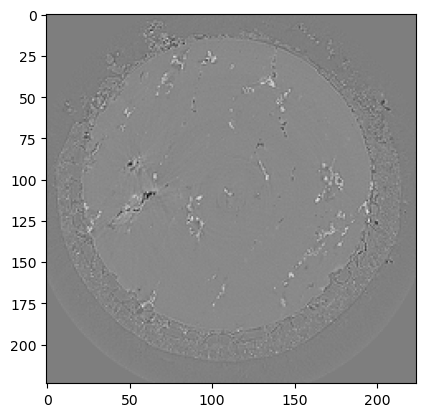

In [165]:
n = 5
img = crack_img[n][0]
img = torch.tensor(img)
plt.imshow(img, cmap = "gray")

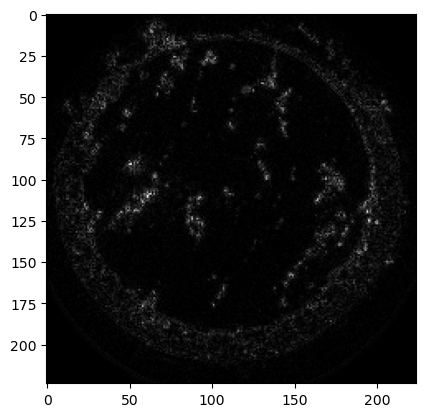

In [166]:
fft_img = fft_filter.fft(img)(120,20)
plt.imshow(fft_img,cmap="gray")

# Channels for transistors

In [167]:
transistor_embed.shape

(213, 448, 56, 56)

In [ ]:
idx = random.sample(range(448), 9)

### Check the channels randomly

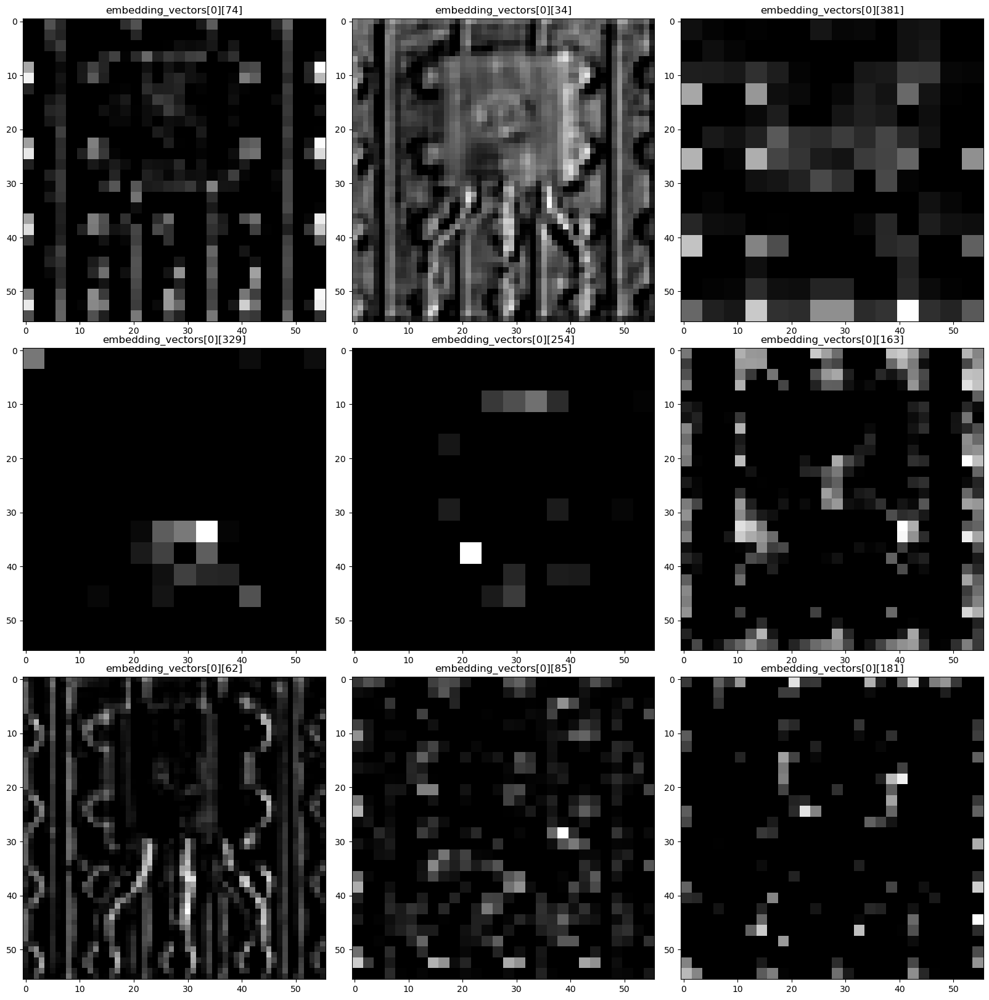

In [183]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = idx[3*i+j]
        channel = transistor_embed[img_num][channel_num]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

## Check the channels sequentially

__The initial channels are from first layer. So, it depicts low level of the image__

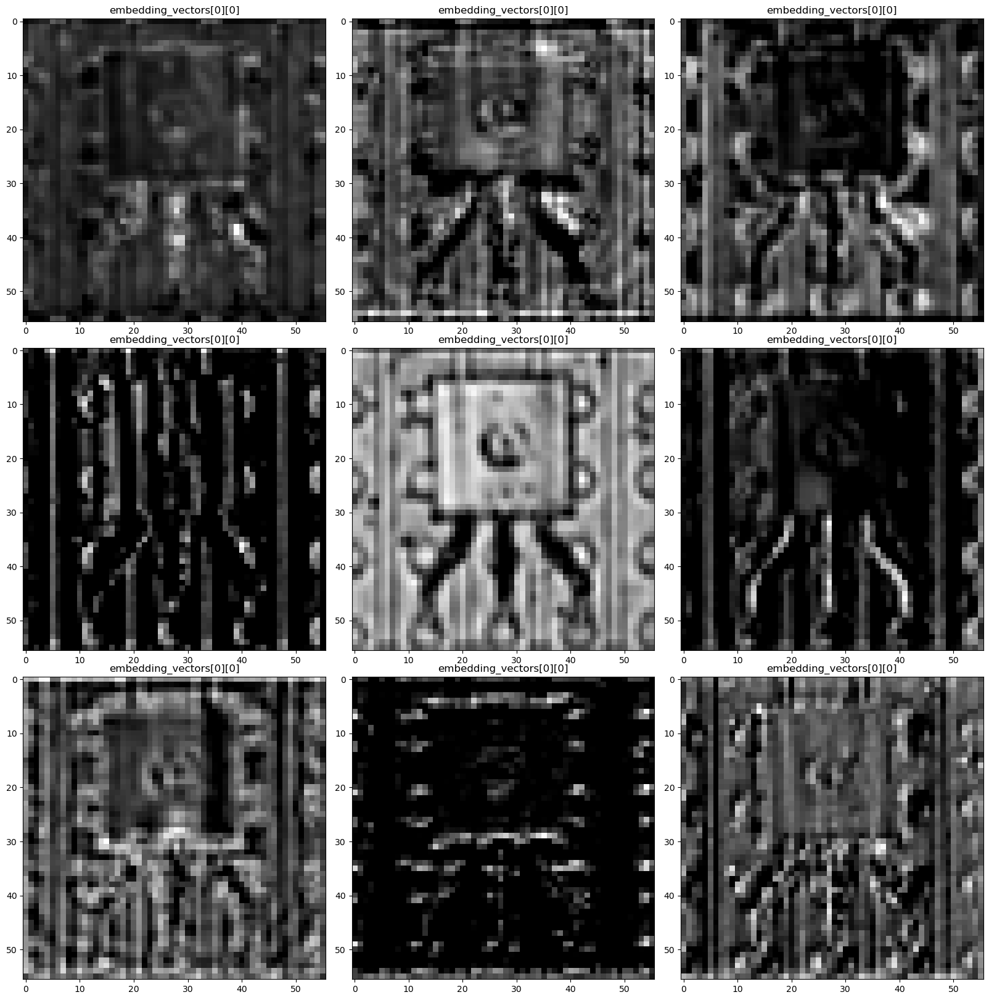

In [184]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 0
        channel = transistor_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

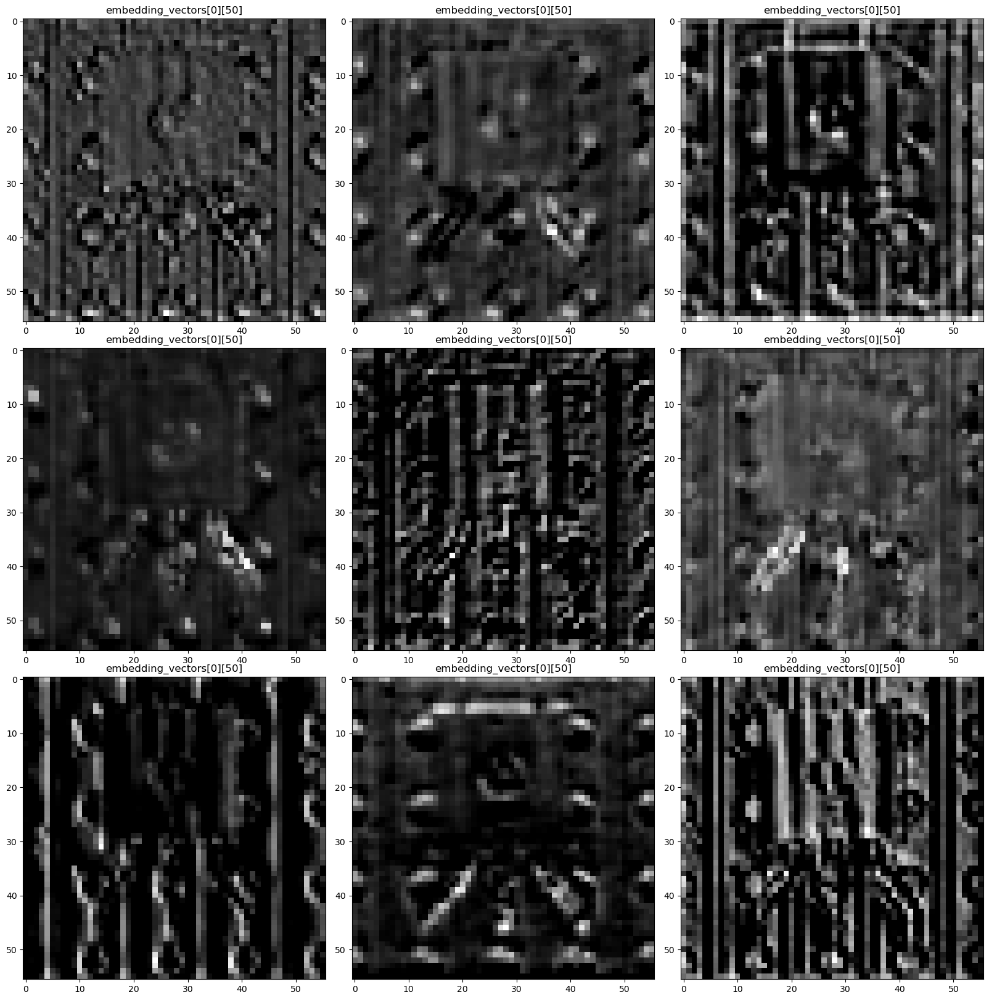

In [188]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 50
        channel = transistor_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

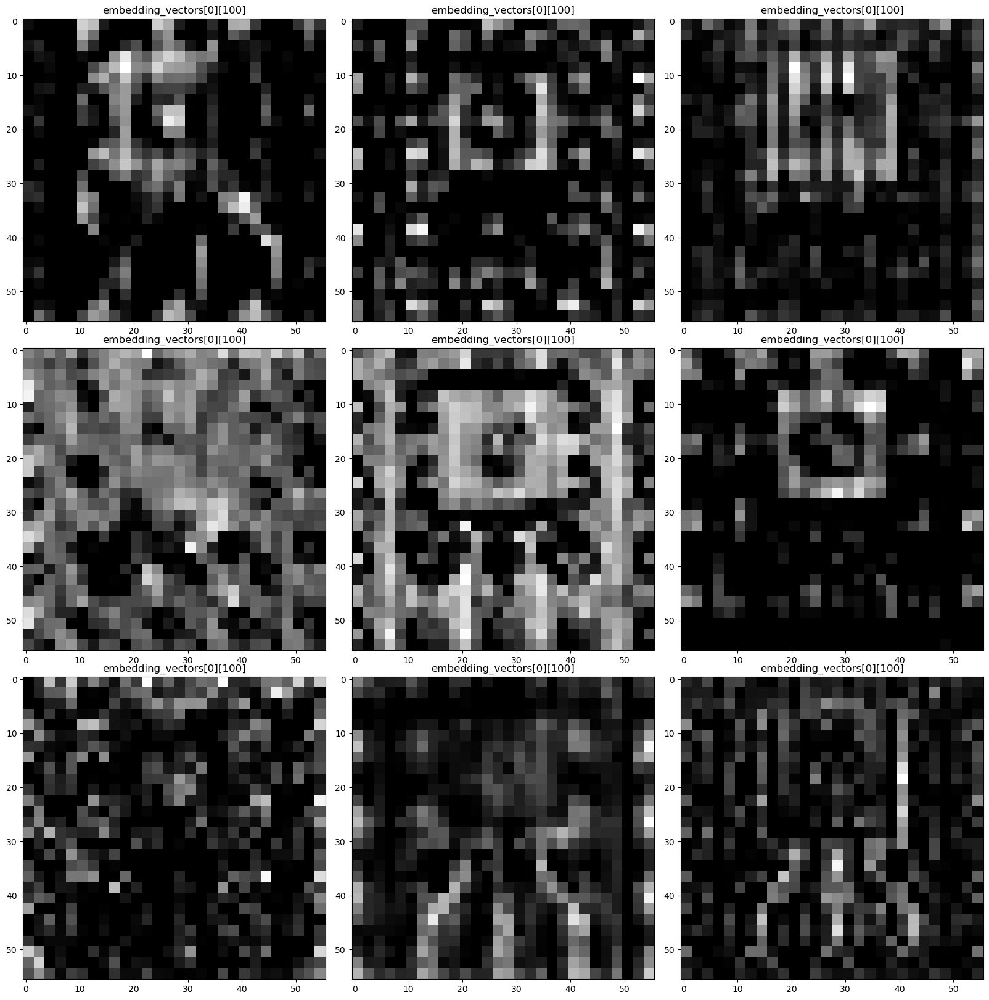

In [187]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 100
        channel = transistor_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

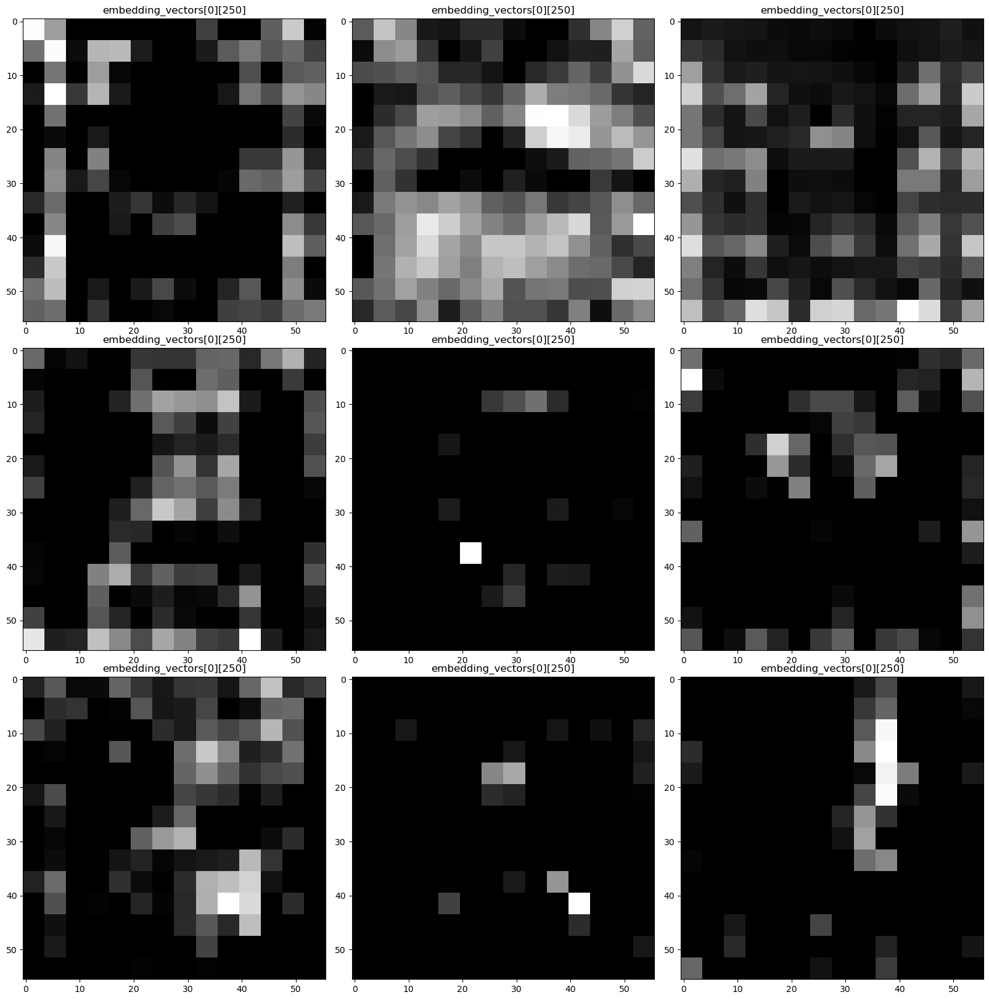

In [185]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 250
        channel = transistor_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

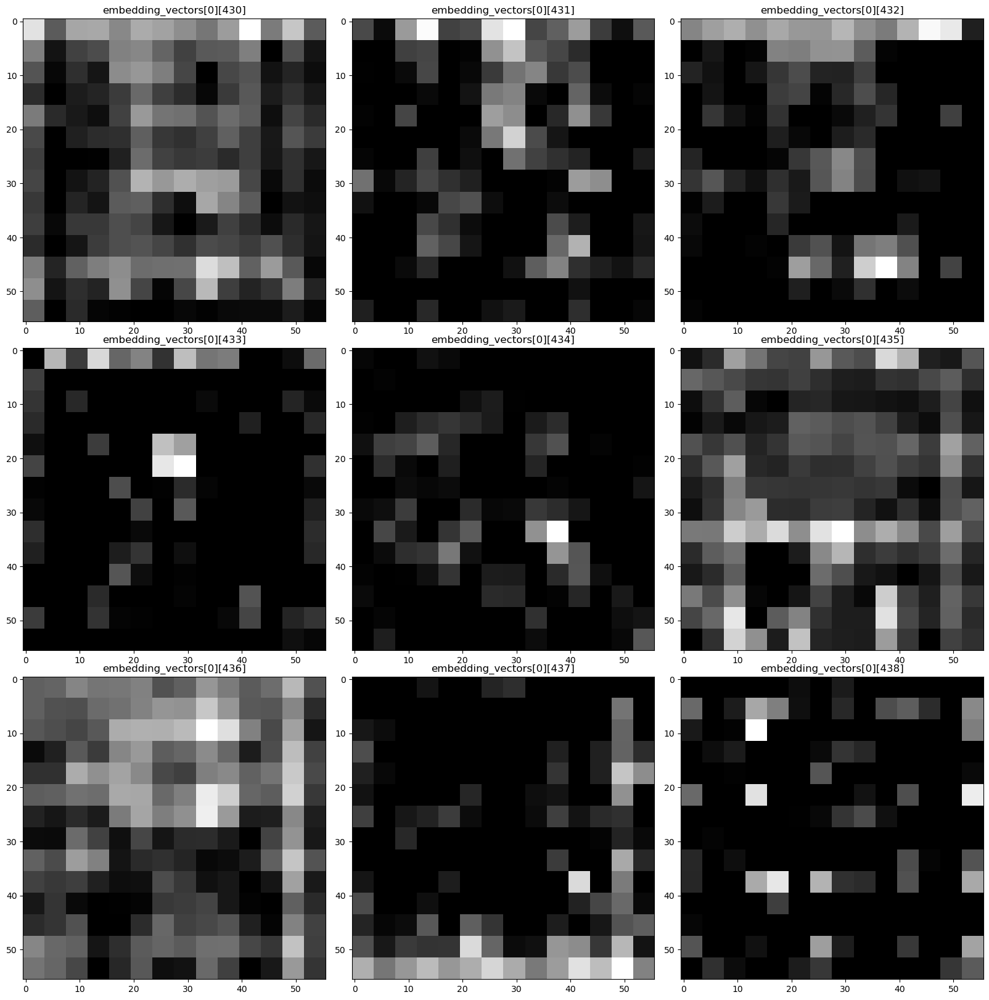

In [193]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 430
        channel = transistor_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*i + j}]"  ) 
plt.show()                      

## Are the channels at same index same for different images ?

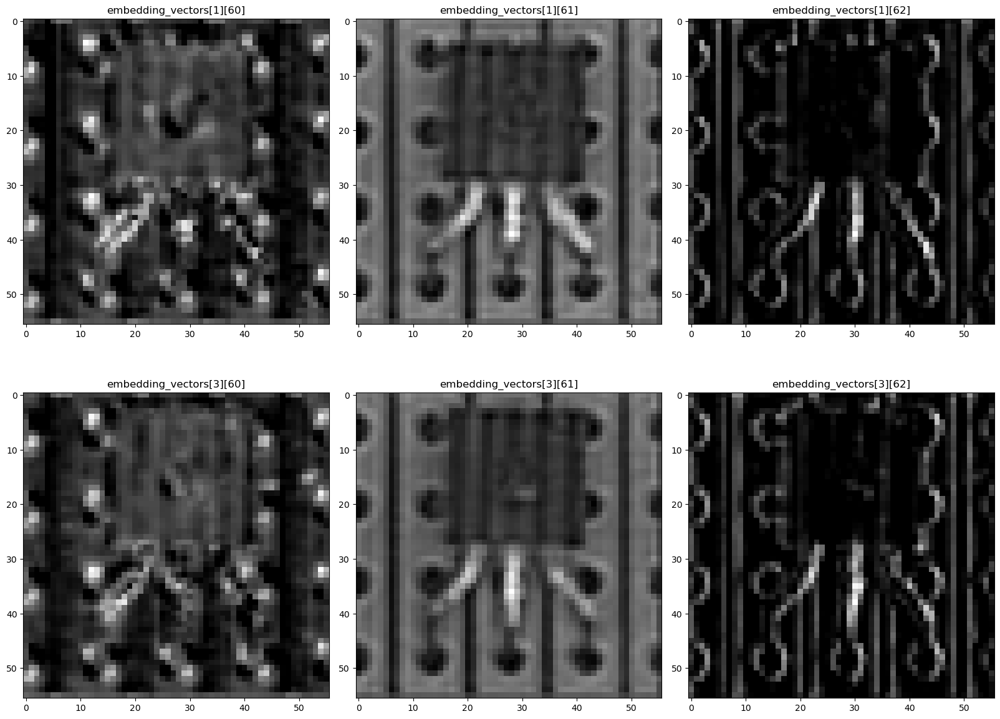

In [200]:
figure, axis = plt.subplots(2, 3 , figsize=(16, 12))
figure.tight_layout(pad = 0)
nums = [1, 3]
for i in range(2):
    k = 0
    for j in range(3):
        img_num = nums[i]
        channel_num = 60
        channel = transistor_embed[img_num][channel_num + 3*k + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*k + j}]"  ) 
plt.show()                      

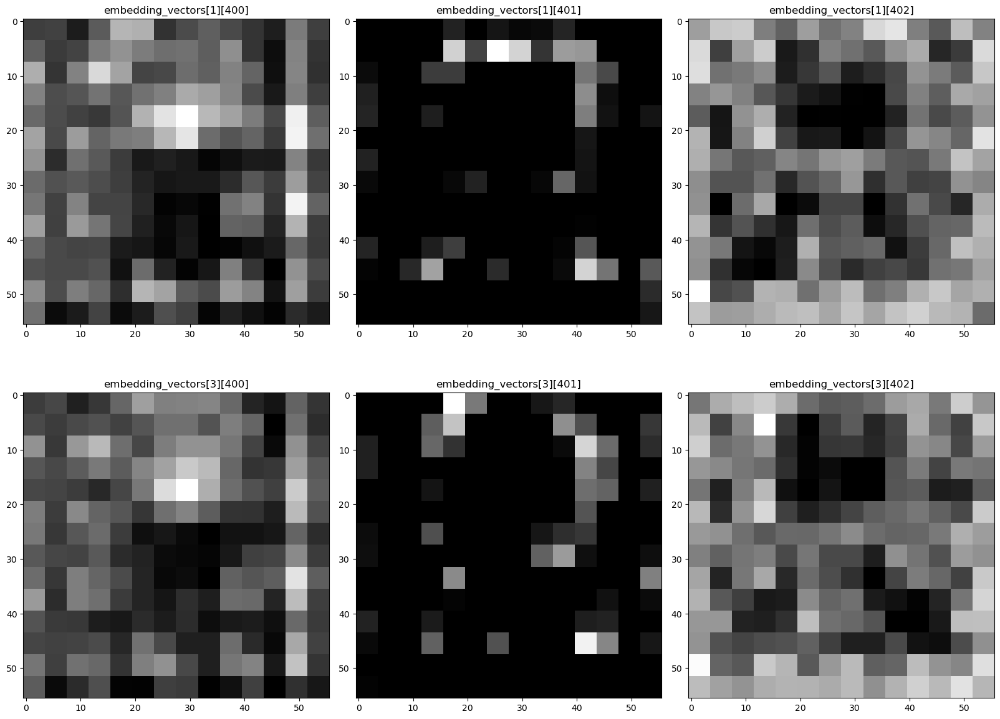

In [201]:
figure, axis = plt.subplots(2, 3 , figsize=(16, 12))
figure.tight_layout(pad = 0)
nums = [1, 3]
for i in range(2):
    k = 0
    for j in range(3):
        img_num = nums[i]
        channel_num = 400
        channel = transistor_embed[img_num][channel_num + 3*k + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*k + j}]"  ) 
plt.show()                      

__They are kind of similar__

# Sort the channels based on distances

In [203]:
# Distance betweeb channel and its fft with raidus 20, 0
def calculateDistance(c):
    channel = c.copy()
    obj = fft_filter.fft(torch.from_numpy(channel))
    c_fft = obj(20,0)
    if np.isnan(c_fft).all():
        return 0.00
    return ((channel-c_fft)**2).sum()

def filter_channels(embedding_vectors, a, b):
    embed_np = embedding_vectors.numpy().copy()
    _imgs = []
    # dictionary for each image with all its channels
    for img_id, image in enumerate(embed_np):
        # stores all the distances of channel and its fft
        channel_dist = {}
        channel_dict = {}
        for channel_id, channel in enumerate(image):
            channel_dist[channel_id] = calculateDistance(channel)
            channel_dict[channel_id] = channel
        # Sort the dictionary
        channel_dist = dict(sorted(channel_dist.items(), key=lambda item: item[1]))
        # select top 100 channels and replace it in the original dictonary 
        channel_dict = {k: channel_dict[k] for k in list(channel_dist.keys())[a:b]}
        # append to the list
        _imgs.append(channel_dict)
    return _imgs

In [420]:
sorted_embed = filter_channels(torch.tensor(transistor_embed), 0, 448)

C:\Users\kiran\OneDrive - Tulane University\semesters\2022 Fall\cv\codes\Segmentation\Segmentation\datasets\fft_filter_normalized.py:106: RuntimeWarning: invalid value encountered in divide
  img = img / (_max - _min)
C:\Users\kiran\OneDrive - Tulane University\semesters\2022 Fall\cv\codes\Segmentation\Segmentation\datasets\fft_filter_normalized.py:41: RuntimeWarning: invalid value encountered in cast
  img_mandp = np.uint8(np.abs(np.fft.ifft2(img_mandp)))
C:\Users\kiran\OneDrive - Tulane University\semesters\2022 Fall\cv\codes\Segmentation\Segmentation\datasets\fft_filter_normalized.py:44: RuntimeWarning: invalid value encountered in divide
  img_mandp=img_mandp/np.max(img_mandp)*255


# Take three images and compare if the channels align similarly

In [422]:
sorted_embed[0][272].shape

(56, 56)

In [423]:
img_idx = [0 ,2, 5]
scatter_list = {}
for i in img_idx:
    order = sorted_embed[i].keys()
    scatter_list[i] = order

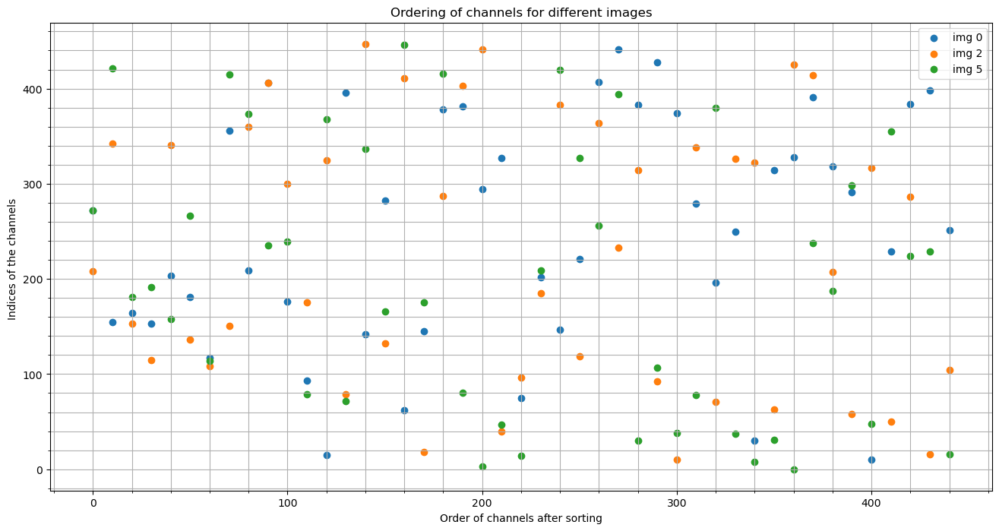

In [426]:
indices = list(range(0,448,10))
img0_order = [ list(scatter_list[0])[i] for i in indices]
img2_order = [ list(scatter_list[2])[i] for i in indices]
img5_order = [ list(scatter_list[5])[i] for i in indices]


fig, ax = plt.subplots(figsize = (16,8))
plt.scatter(indices, img0_order)
plt.scatter(indices, img2_order)
plt.scatter(indices, img5_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["img 0", "img 2", "img 5"])
plt.title("Ordering of channels for different images")
# Enabling minor grid lines:
ax.grid(which = "both")
ax.minorticks_on()

plt.show()

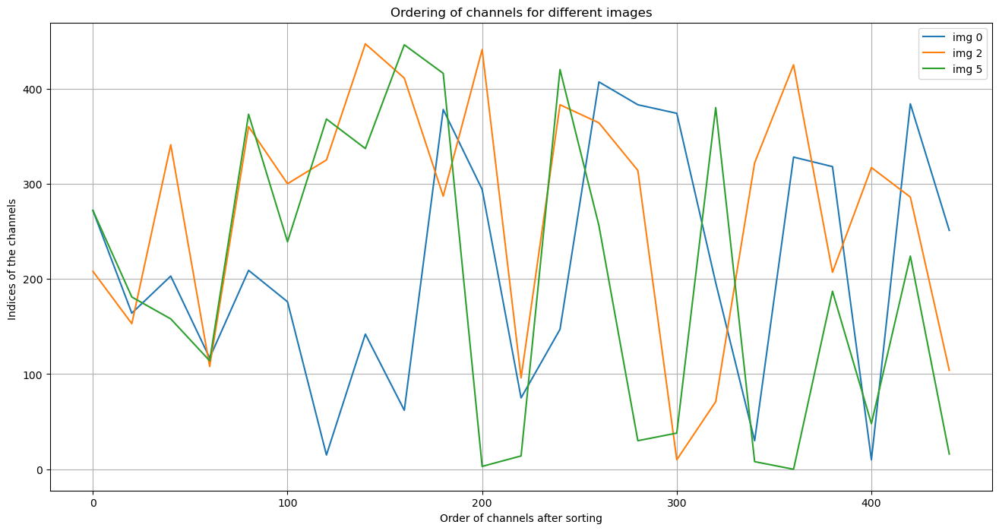

In [433]:
indices = list(range(0,448,20))
img0_order = [ list(scatter_list[0])[i] for i in indices]
img2_order = [ list(scatter_list[2])[i] for i in indices]
img5_order = [ list(scatter_list[5])[i] for i in indices]


plt.figure(figsize = (16,8))
plt.plot(indices, img0_order)
plt.plot(indices, img2_order)
plt.plot(indices, img5_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["img 0", "img 2", "img 5"])
plt.title("Ordering of channels for different images")
plt.legend(["img 0", "img 2", "img 5"])
plt.grid()
plt.show()

__Hence it shows that FFT distance does not order uniformly__

In [347]:
def filter_channels_using_oneImg(embedding_vectors, a, b, rand_int):
    embed_np = transistor_embed.copy()
    _imgs = []
    img_id = rand_int
    image = embed_np[img_id]
    # stores all the distances of channel and its fft
    channel_dist = {}
    channel_dict = {}
    for channel_id, channel in enumerate(image):
        channel_dist[channel_id] = calculateDistance(channel)
        channel_dict[channel_id] = channel
    # Sort the dictionary
    channel_dist = dict(sorted(channel_dist.items(), key=lambda item: item[1]))
    # we take the index of this dictionary and seelct the top ones
    # Based on the index of the top ones, we slice the dictionary
    return torch.index_select(torch.tensor(embed_np), 1, torch.tensor(list(channel_dist.keys())[a:b])), torch.tensor(list(channel_dist.keys())[a:b])

In [470]:
img_id = random.randint(0,embed_np.shape[0])

low_sorted_embed, low_order = filter_channels_using_oneImg(torch.tensor(transistor_embed), 0, 100, img_id)
high_sorted_embed, high_order = filter_channels_using_oneImg(torch.tensor(transistor_embed), 300, 400, img_id)
mid_sorted_embed, mid_order = filter_channels_using_oneImg(torch.tensor(transistor_embed), 100, 300, img_id)

This means for all the images, we have 272 th indexed channel in the first place after slicing

In [349]:
img_idx = [0 ,2, 5]
scatter_list = {}
for i in img_idx:
    order = sorted_embed[i].keys()
    scatter_list[i] = order

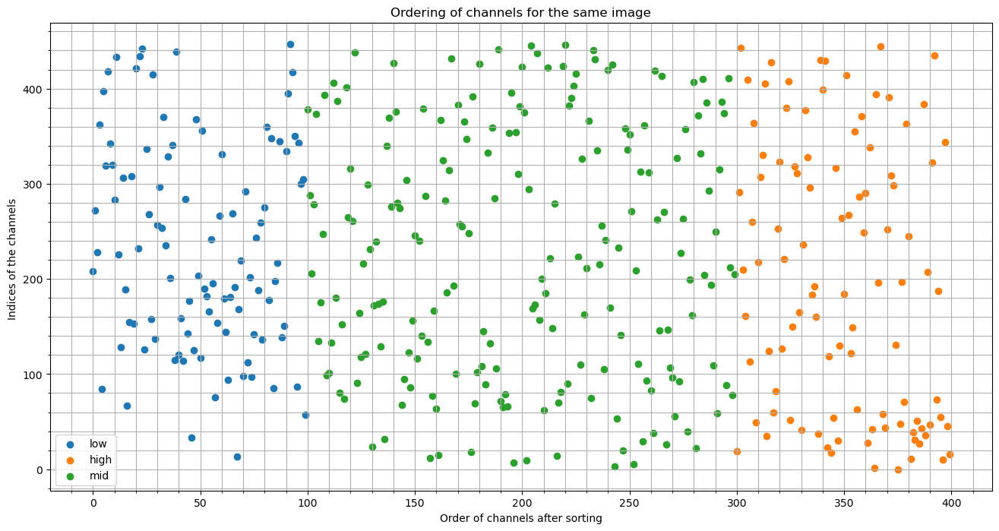

In [473]:
# order_indices = list(range(0,448,10))
# img0_order = [ list(low_order[i])[i] for i in list(range(0,100))]
# img2_order = [ list(high_order[i])[i] for i in list(range(300,400))]
# img5_order = [ list(mid_order[i] for i in list(range(100,300)))]


fig, ax = plt.subplots(figsize = (16,8))
plt.scatter(list(range(0,100)), low_order)
plt.scatter(list(range(300,400)), high_order)
plt.scatter(list(range(100,300)), mid_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["low", "high", "mid"])
plt.title("Ordering of channels for the same image")
# Enabling minor grid lines:
ax.grid(which = "both")
ax.minorticks_on()

plt.show()

Not much information here

In [351]:
tran_test_embed.shape

(10, 448, 56, 56)

In [352]:
transistor_embed.shape

(213, 448, 56, 56)

In [353]:
low_sorted_embed.shape

torch.Size([213, 100, 56, 56])

In [354]:
torch.tensor(transistor_embed).shape

torch.Size([213, 448, 56, 56])

### Find normal distribution

In [438]:
train_outputs = []

In [439]:
for x_embed in [low_sorted_embed, mid_sorted_embed, high_sorted_embed]:
    B, C, H, W = x_embed.shape
    embedding_vectors = x_embed.view(B, C, H * W)
    
    mean = torch.mean(embedding_vectors, dim=0).numpy()

    # shape C, C,3136
    cov = torch.zeros(C, C, H * W).numpy()

    I = np.identity(C)

    # Covariance for each feature index
    for i in range(H * W):
        # Each C x C from C x C x (H * W)
        cov[:, :, i] = np.cov(embedding_vectors[:, :, i].numpy(), rowvar=False) + 0.01 * I
    
    train_outputs.append([mean, cov]) 

In [440]:
train_outputs[0][0].shape

(100, 3136)

In [441]:
len(train_outputs)

3

### Find distance and score

In [442]:
tran_test_embed.shape

(10, 448, 56, 56)

In [443]:
scores = []
for k, _order in enumerate([low_order, mid_order, high_order]):
    embedding_vectors = torch.index_select(torch.tensor(tran_test_embed), 1, _order)
    # calculate distance matrix
    B, C, H, W = embedding_vectors.size()
    embedding_vectors = embedding_vectors.view(B, C, H * W).numpy()

    dist_list = []

    for i in range(H * W):
        # ith feature mean, shape (100,)
        # Each specific attrribute is represented by 100 x 1 mean vector
        mean = train_outputs[k][0][:, i]

        # Inverse of covariance of ith feature
        conv_inv = np.linalg.inv(train_outputs[k][1][:, :, i])

        """
        _img: 100 channels and 3136 feature indices, shape = (100, 3136) for particular image
        _img[:, i] shape (100,); for ith feature gives all 100 channel values 
        """ 

        dist = [mahalanobis(_img[:, i], mean, conv_inv) for _img in embedding_vectors]
        dist_list.append(dist)

    # Reshaping to 449 x 56 x 56
    dist_list = np.array(dist_list).transpose(1, 0).reshape(B, H, W)
    # Numpy into tensor
    dist_list = torch.tensor(dist_list)
    # unsqueeze adds dimenstion and new dimension is (449, 1, 56, 56)
    # size is 224, which is size of original img
    # squeeze() removes the single dimensions
    score_map = F.interpolate(dist_list.unsqueeze(1), size= 224, mode='bilinear', align_corners=False).squeeze().numpy()

    # apply gaussian smoothing on the score map (on each 56 x 56 imgs)
    for i in range(score_map.shape[0]):
        score_map[i] = gaussian_filter(score_map[i], sigma=4)

    # Normalization
    max_score = score_map.max()
    min_score = score_map.min()
    _scores = (score_map - min_score) / (max_score - min_score)
    scores.append(_scores)

In [444]:
def denormalization(x):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    x = (((x.transpose(1, 2, 0) * std) + mean) * 255.).astype(np.uint8)
    
    return x

# Plot

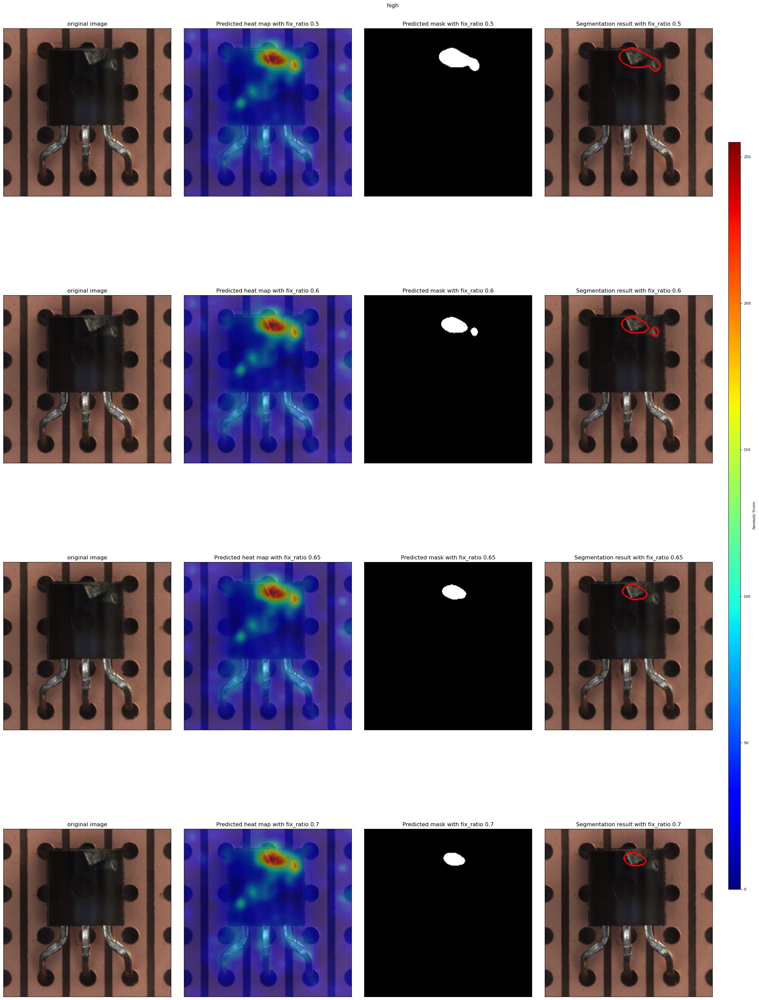

In [461]:
save = False
fix_ratios = [0.5, 0.6, 0.65, 0.7]
plot_fig(test_imgs ,scores[0], fix_ratios, save_dir, title = orders[j])

low


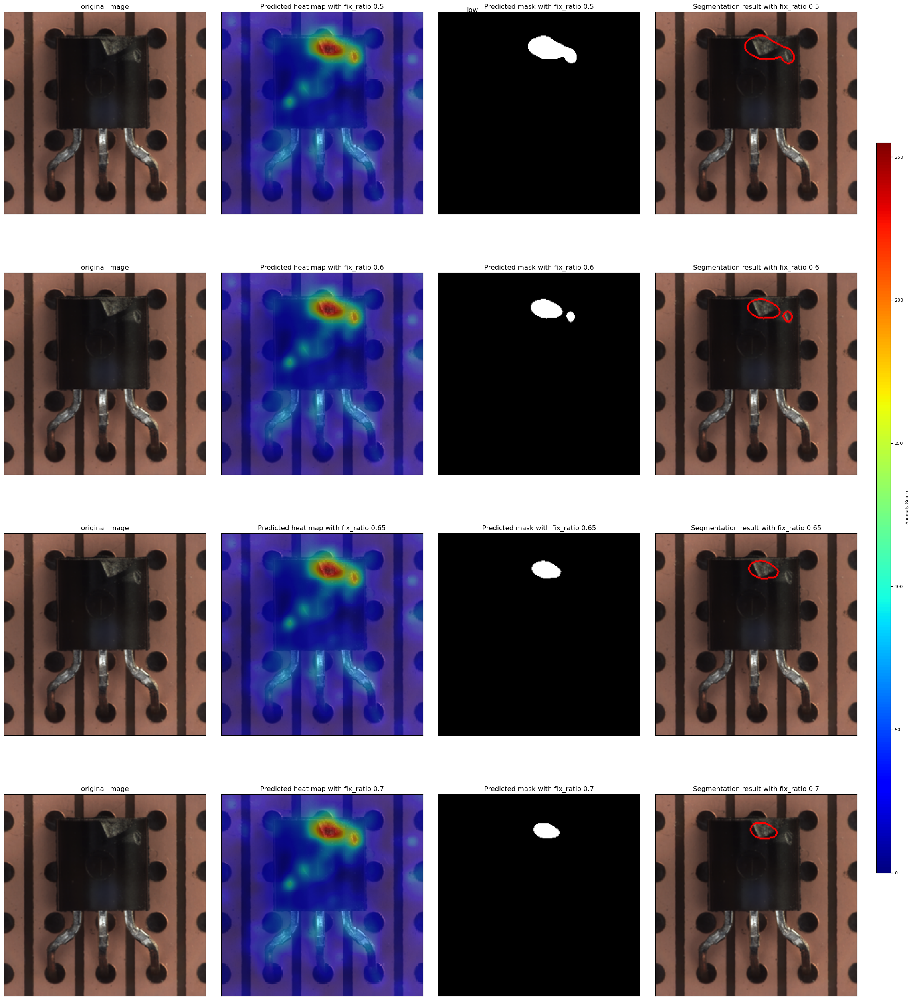

mid


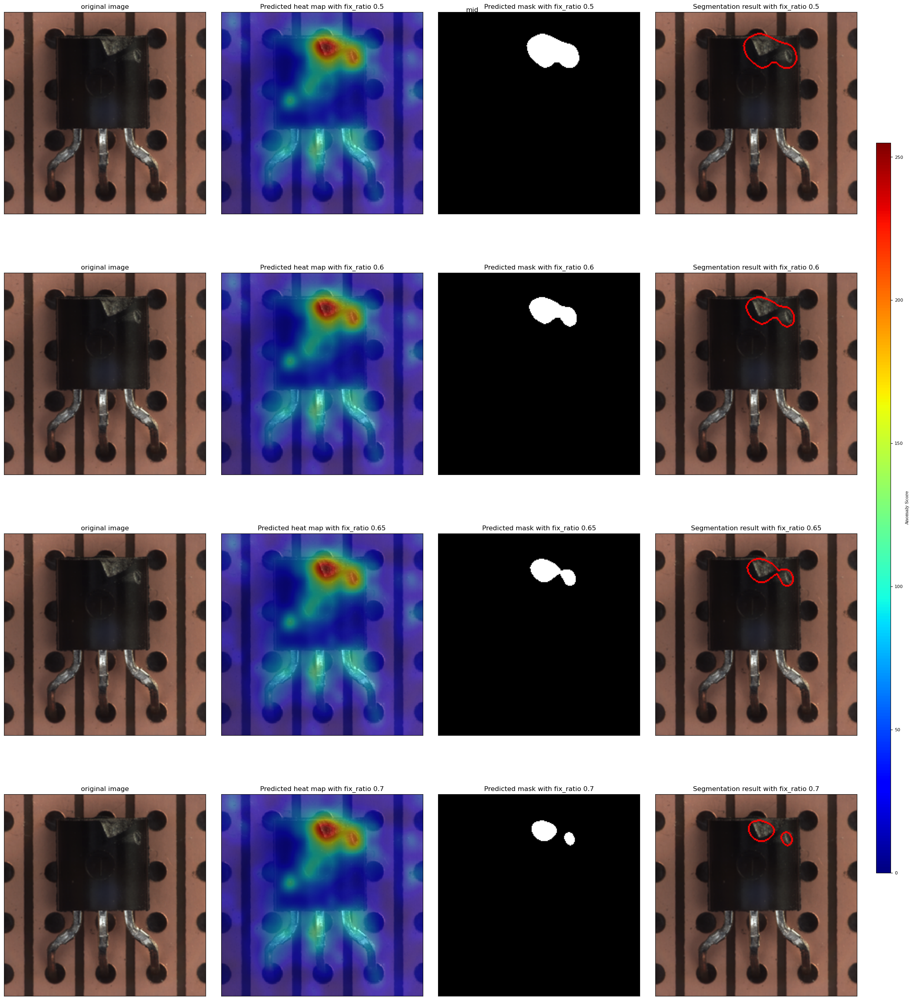

high


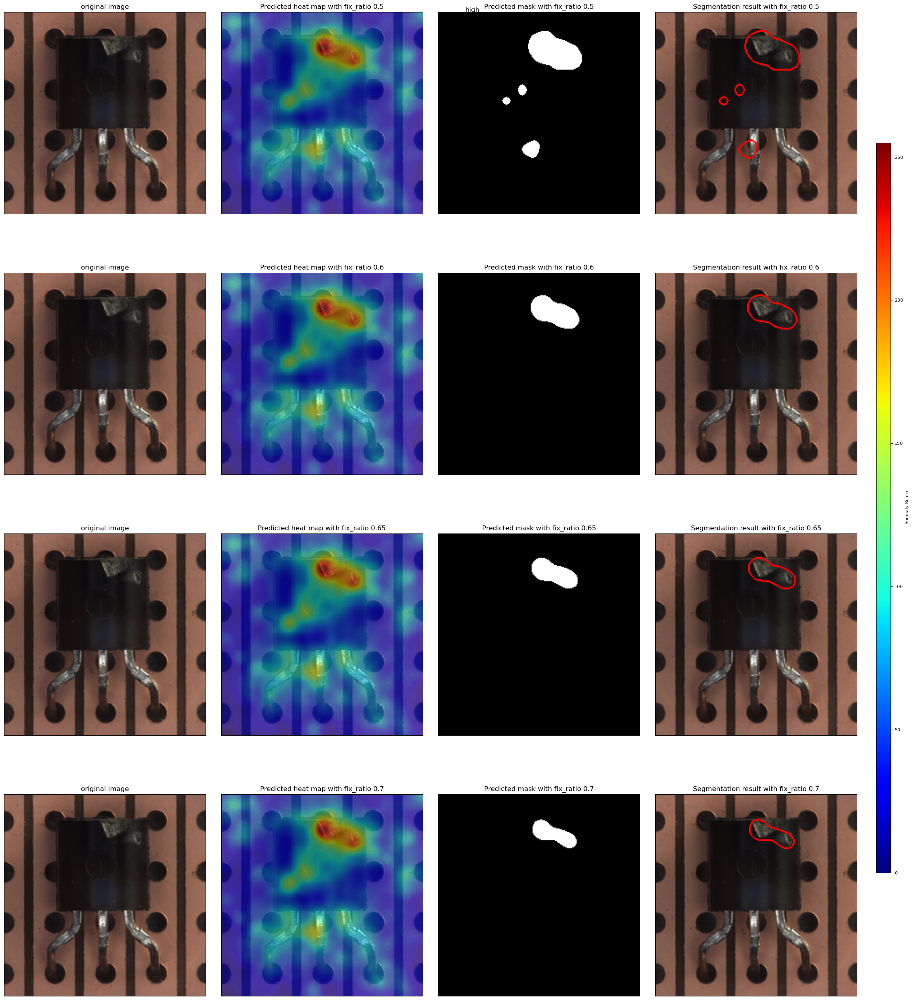

In [468]:
save = False
fix_ratios = [0.5, 0.6, 0.65, 0.7]
orders = ["low", "mid", "high"]
for j in range(3):
    print(orders[j])
    plot_fig(test_imgs ,scores[j], fix_ratios, save_dir, title = orders[j])

## If you want to save the result

In [418]:
extra = "mid_Order"
save_dir = file_location + transistor_path +"results/"+ f'pictures' + "_"+ extra
save_dir

'./resulting_imgs/data_science/transistor/good_misplaced/results/pictures_mid_Order'

In [419]:
os.makedirs(save_dir, exist_ok=True)
fix_ratios = [0.5, 0.6, 0.65, 0.7]
plot_fig(test_imgs ,scores, fix_ratios, save_dir)